# PPL to Performance Correlation


In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
sys.path.insert(0, os.path.abspath('../../../../'))
#print(sys.path)

import glob
import json
import re
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats
import time
import copy
import pandas as pd
from pandas import DataFrame
from examples.few_shot.scripts.display_results import get_checkpoint_step_form_modelname
from examples.few_shot.tasks_organization import get_task_display_groups, get_tasks_to_groups_mapping, get_groups_to_groups_mapping, invert_dict

task_display_groups = get_task_display_groups()
task_display_groups["all_no_blimp"] = [x for x in task_display_groups["all"] if not x.startswith("blimp")]
task_to_groups = get_tasks_to_groups_mapping(task_display_groups)
groups_to_groups = get_groups_to_groups_mapping(task_display_groups)

# update task to groups with groups to groups -- to show all for groups, etc


Read the raw results file:

In [2]:
# This is the path to the raw results file generated with the script

# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-06-14-ppl-eval -o _results/2021-06-14-ppl-eval-results.tsv -r 
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-06-14-ppl-eval-results.tsv.raw.jsonl"

# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-06-30-ppl-eval-moe -o _results/2021-06-30-ppl-eval-moe.tsv -r
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-06-30-ppl-eval-moe.tsv.raw.jsonl"

#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-06-14-ppl-eval /checkpoint/tbmihaylov/few_shot/2021-06-30-ppl-eval-moe  -o _results/2021-07-06-ppl-eval-results-dense-and-moe.tsv -r 
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-07-06-ppl-eval-results-dense-and-moe.tsv.raw.jsonl"

#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-07-23-ppl-eval-checkpoints -o _results/2021-07-23-ppl-eval-checkpoints.tsv -r 
results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-07-23-ppl-eval-checkpoints.tsv.raw.jsonl"

#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-07-calibration -o _results/2021-07-calibration.tsv -r 
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-07-calibration.tsv.raw.jsonl"

#results_json = "/checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl"
results_json = "/checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl"

In [3]:
model_name_to_checkpoints = {}
results = []

expand_task_groups = True  # This will copy the task results and add them as "group" results. 
                           # This way when aggregate we get the group avg scores! 

current_tasks_to_groups = {}
with open(results_json) as f_res:
    for line in f_res:
        line = line.strip()
        item = json.loads(line)
        for k in list(item.keys()):
            if k.startswith("ppl_candidates_full_prompt__"):
                del item[k]
                
        current_task_name = item["task"]
        if "checkpoint_steps" not in item: 
            item["checkpoint_steps"] = get_checkpoint_step_form_modelname(item["model_name"])
        model_name_to_checkpoints[item["model_name"]] = item["checkpoint_steps"]
        
        if "macro_F1::scores" in item:
            item["macro_F1::max"] = max(item["macro_F1::scores"])
            item["macro_F1::min"] = max(item["macro_F1::scores"])
        if "accuracy::scores" in item:
            item["accuracy::max"] = max(item["accuracy::scores"])
            item["accuracy::min"] = max(item["accuracy::scores"])
        results.append(item)
        
        if expand_task_groups:
            task_groups = task_to_groups.get(current_task_name, [])
            for tg in task_groups:
                group_result = copy.deepcopy(item)
                group_result["task"] = tg
                group_result["template"] = "*"
                results.append(group_result)
            if current_task_name not in current_tasks_to_groups:
                current_tasks_to_groups[current_task_name] = task_groups
                
print(f"{len(results)} items (expand_task_groups:{expand_task_groups})")
current_groups = invert_dict(current_tasks_to_groups)
for k,v in current_groups.items():
    print_v = v[:10] + (['...'] if len(v)>10 else [])
    print(f"-{k} ({len(v)}): {', '.join(print_v)}")
print()


4500 items (expand_task_groups:True)
-all (1): xnli
-all_no_blimp (1): xnli



In [4]:
print(model_name_to_checkpoints)

{'1.3B_gpt3_setting__step00001000': 1000, '1.3B_gpt3_setting__step00002000': 2000, '1.3B_gpt3_setting__step00003000': 3000, '1.3B_gpt3_setting__step00004000': 4000, '1.3B_gpt3_setting__step00005000': 5000, '1.3B_gpt3_setting__step00006000': 6000, '1.3B_gpt3_setting__step00007000': 7000, '1.3B_gpt3_setting__step00008000': 8000, '1.3B_gpt3_setting__step00009000': 9000, '1.3B_gpt3_setting__step00010000': 10000, '1.3B_gpt3_setting__step00011000': 11000, '1.3B_gpt3_setting__step00012000': 12000, '1.3B_gpt3_setting__step00013000': 13000, '1.3B_gpt3_setting__step00014000': 14000, '1.3B_gpt3_setting__step00020000': 20000, '1.3B_gpt3_setting__step00050000': 50000, '1.3B_gpt3_setting__step00100000': 100000, '1.3B_gpt3_setting__step00150000': 150000, '1.3B_gpt3_setting__step00200000': 200000, '1.3B_gpt3_setting__step00250000': 250000}


In [5]:
# Calculating contrast values
for row in results:
    for ppl_corr, ppl_incorr in [("ppl_full_correct_gold", "ppl_full_incorrect_gold"), 
                              ("ppl_answer_correct_gold", "ppl_answer_incorrect_gold")]:
        ppl_corr_scores = row.get(ppl_corr+"::scores", None)
        ppl_incorr_scores = row.get(ppl_incorr+"::scores", None)
        
        
        if not isinstance(ppl_corr_scores, list) or not isinstance(ppl_incorr_scores, list):
            continue
                
        for cf_name, cf in [
                            #("diff", lambda pos,neg: pos-neg), 
                            ("ratio", lambda pos,neg: pos/neg),
                            #("ratio_sum", lambda pos,neg: pos/(pos+neg)),
                           ]:
            new_val_name = f"contrast-ppl-{cf_name}--{ppl_corr}-{ppl_incorr}"
            #print(new_val_name)
            
            new_val_scores = [cf(pos, neg) for pos,neg in zip(ppl_corr_scores, ppl_incorr_scores)]
            if cf_name == "diff":
                print(new_val_scores)
            row[new_val_name+"::scores"] = new_val_scores
            row[new_val_name+"::mean"] = np.mean(new_val_scores)
            row[new_val_name+"::std"] = np.std(new_val_scores)
            
            #print(row[new_val_name+"::scores"])



In [6]:
df = DataFrame.from_records(results)
print({x: 0.0 for x in set(df["model_name"])})
# drop some overgenerated columns
columns_to_drop = [x for x in list(df.columns) if x.startswith("ppl_candidates_full_prompt__")]
df.drop(columns=columns_to_drop, inplace=True)
list(df.columns)

{'1.3B_gpt3_setting__step00013000': 0.0, '1.3B_gpt3_setting__step00050000': 0.0, '1.3B_gpt3_setting__step00003000': 0.0, '1.3B_gpt3_setting__step00007000': 0.0, '1.3B_gpt3_setting__step00100000': 0.0, '1.3B_gpt3_setting__step00008000': 0.0, '1.3B_gpt3_setting__step00001000': 0.0, '1.3B_gpt3_setting__step00005000': 0.0, '1.3B_gpt3_setting__step00250000': 0.0, '1.3B_gpt3_setting__step00006000': 0.0, '1.3B_gpt3_setting__step00012000': 0.0, '1.3B_gpt3_setting__step00009000': 0.0, '1.3B_gpt3_setting__step00014000': 0.0, '1.3B_gpt3_setting__step00150000': 0.0, '1.3B_gpt3_setting__step00200000': 0.0, '1.3B_gpt3_setting__step00004000': 0.0, '1.3B_gpt3_setting__step00011000': 0.0, '1.3B_gpt3_setting__step00002000': 0.0, '1.3B_gpt3_setting__step00020000': 0.0, '1.3B_gpt3_setting__step00010000': 0.0}


['model_name',
 'task',
 'language',
 'template',
 'nb_few_shot_samples',
 'calibration_options',
 'calibrator_name',
 'train_set',
 'valid_set',
 'eval_set',
 'train_lang',
 'valid_lang',
 'ppl_common_prefix::scores',
 'ppl_common_prefix::mean',
 'ppl_common_prefix::std',
 'ppl_common_prefix::mean_confidence_interval',
 'ppl_selected_candidate::scores',
 'ppl_selected_candidate::mean',
 'ppl_selected_candidate::std',
 'ppl_selected_candidate::mean_confidence_interval',
 'ppl_full_selected_candidate::scores',
 'ppl_full_selected_candidate::mean',
 'ppl_full_selected_candidate::std',
 'ppl_full_selected_candidate::mean_confidence_interval',
 'ppl_candidates_full_prompt::scores',
 'ppl_candidates_full_prompt::mean',
 'ppl_candidates_full_prompt::std',
 'ppl_candidates_full_prompt::mean_confidence_interval',
 'ppl_candidates::scores',
 'ppl_candidates::mean',
 'ppl_candidates::std',
 'ppl_candidates::mean_confidence_interval',
 'accuracy::scores',
 'accuracy::mean',
 'accuracy::std',
 'ac

The results has the followinf columns:

In [7]:
#list(df.columns)
ppl_fields_cor_to_incorr = [x for x in list(df.columns) if x.startswith("contrast")]
print(ppl_fields_cor_to_incorr)

#df[ppl_fields_cor_to_incorr]

['contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::scores', 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean', 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::std', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::scores', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::std']


# Calculate correlations

In [8]:
df_correlations  = df

# Calculate correlations
ppl_fields_cor_to_incorr = [x.rstrip("::scores") for x in list(df_correlations.columns) if x.startswith("contrast") and x.endswith("::scores")]
print(ppl_fields_cor_to_incorr)
fields1 = sorted(["ppl_candidates_full_prompt",
           "ppl_candidates",
           "ppl_full_correct_gold", 
           "ppl_full_incorrect_gold", 
           "ppl_answer_correct_gold",
           "ppl_answer_incorrect_gold"
#            "ppl_selected_candidate",
#            "ppl_full_selected_candidate",
#            "ppl_common_prefix"
          ] + ppl_fields_cor_to_incorr)
fields2 = ["accuracy"]

for idx, row in df_correlations.iterrows():
    for fld1 in fields1:
        fld1_scores =  f"{fld1}::scores"
        
        #print(row[fld1_scores])
        #break
        fld1_score_vals = row[fld1_scores]
#         if fld1_scores.startswith("contrast"):
#             print(type(fld1_score_vals))
            
#             break

        if not isinstance(fld1_score_vals, list):
            continue
        if len(fld1_score_vals) < 2:
            continue
            
            
        fld1_score_vals = row[fld1_scores]
        for fld2 in fields2:
            fld2_scores =  f"{fld2}::scores"
            fld2_score_vals = row[fld2_scores]
            if not isinstance(fld2_score_vals, list):
                continue
            if len(fld2_score_vals) < 2:
                continue  
            
            try:
                pearsonr, pvalue = stats.pearsonr(fld1_score_vals, fld2_score_vals) 
                for corr_k, corr_v in [("pearsonr", pearsonr), ("pvalue",pvalue)]:
                    corr_key = f"corr-model-runs-{fld1}-{fld2}-{corr_k}"
                    row[corr_key] = corr_v  
                    if "pearsonr" in corr_key and "candidates" in corr_key and abs(corr_v) > 0.5:
                        print(row["task"], row["model_name"], row["nb_few_shot_samples"], corr_key, corr_v)
            except Exception as e:
                print(f"Error with {idx}:"+ str(e))
df_correlations.columns

['contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold']


Index(['model_name', 'task', 'language', 'template', 'nb_few_shot_samples',
       'calibration_options', 'calibrator_name', 'train_set', 'valid_set',
       'eval_set',
       ...
       '_metric_val', '_metric_val_std', 'accuracy::max', 'accuracy::min',
       'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::scores',
       'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean',
       'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::std',
       'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::scores',
       'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean',
       'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::std'],
      dtype='object', length=111)

In [9]:
def cb_view(df, values=["_metric_val", "_metric_val_std"], model_headers_on_top=True):
    pt = pd.pivot_table(df, values=values, index=["task", "language", "template", "nb_few_shot_samples", "_metric", "calibration", "run_params::scoring", "run_params::train_sep"],
                        columns=['model_name',
                                ], aggfunc=np.mean)
    if model_headers_on_top:
        pt = pt.swaplevel(0, 1, axis=1).sort_index(axis=1)
    return pt


filtered_df = df 

ppl_columns = ["ppl_full_correct_gold::mean", "ppl_full_correct_gold::std", 
                                  "ppl_full_incorrect_gold::mean", "ppl_full_incorrect_gold::std" 
                                 ]

view_cols = ["accuracy::mean", "accuracy::std"] + ["ppl_common_prefix::mean"] +  ppl_columns + [x.replace("_full_", "_answer_") for x in ppl_columns]
pt = cb_view(filtered_df, values=[x.replace("_full_", "_answer_") for x in view_cols], model_headers_on_top=False)
out_file = results_json+"_ppl_full_all.tsv"
pt.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

pt



exported to /checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl_ppl_full_all.tsv


accuracy::mean  \
model_name                                                                                                                       1.3B_gpt3_setting__step00001000   
task language template                        nb_few_shot_samples _metric  calibration run_params::scoring run_params::train_sep                                   
all  ar       *                               0                   accuracy False       mean                \n                                          33.349398   
     bg       *                               0                   accuracy False       mean                \n                                          33.365462   
     de       *                               0                   accuracy False       mean                \n                                          33.742972   
     el       *                               0                   accuracy False       mean                \n                                          33.253012   
     en       *                               0                   accuracy False       mean                \n                                          34.160643   
...                                                                                                                                                          ...   
xnli zh       generativenli                   0                   accuracy False       mean                \n                                          33.172691   
              xnli_generativenli__en          0                   accuracy False       mean                \n                                          33.172691   
              xnli_generativenli_mt           0                   accuracy False       mean                \n                                          32.610442   
              xnli_generativenli_sentence__en 0                   accuracy False       mean                \n                                          33.293173   
              xnli_generativenli_sentence_mt  0                   accuracy False       mean                \n                                          32.248996   

                                                                                                                                                                  \
model_name                                                                                                                       1.3B_gpt3_setting__step00002000   
task language template                        nb_few_shot_samples _metric  calibration run_params::scoring run_params::train_sep                                   
all  ar       *                               0                   accuracy False       mean                \n                                          31.927711   
     bg       *                               0                   accuracy False       mean                \n                                          33.686747   
     de       *                               0                   accuracy False       mean                \n                                          34.393574   
     el       *                               0                   accuracy False       mean                \n                                          34.730924   
     en       *                               0                   accuracy False       mean                \n                                          40.096386   
...                                                                                                                                                          ...   
xnli zh       generativenli                   0                   accuracy False       mean                \n                                          33.052209   
              xnli_generativenli__en          0                   accuracy False       mean                \n                                          33.052209   
              xnli_generativenli_mt          

In [10]:
# Determine the results that are missing for some models. 
missing_results = []
for ind, row in pt.iterrows():
    for [col, model], val in row.items():
        if col == "accuracy::mean" and np.isnan(val):
            missing_results.append((ind[0], ind[3], model))

set(missing_results)
#filtered_df[filtered_df["task"]=="wsc"]

set()

In [11]:
#df[df["run_params::train_sep"] == "\n\n"]

# Correlations by models

In [12]:
# group by model
selected_df = df

metrics_cols = sorted([x + "::mean" for x in list(set(selected_df["_metric"]))])
print(f"metrics_cols:{metrics_cols}")

ppl_cols = sorted([x for x in list(selected_df.columns) 
            if (x.startswith("ppl_") or x.startswith("contrast-"))  and x.endswith("::mean") and "prompt__" not in x])
print(f"ppl_cols:{ppl_cols}")

value_columns = metrics_cols + ppl_cols


metrics_cols:['accuracy::mean']
ppl_cols:['contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean', 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean', 'ppl_answer_correct_gold::mean', 'ppl_answer_correct_lt_incorrect_gold::mean', 'ppl_answer_incorrect_gold::mean', 'ppl_answer_incorrect_min_gold::mean', 'ppl_answer_incorrect_std_gold::mean', 'ppl_candidates::mean', 'ppl_candidates_full_prompt::mean', 'ppl_common_prefix::mean', 'ppl_full_correct_gold::mean', 'ppl_full_correct_lt_incorrect_gold::mean', 'ppl_full_incorrect_gold::mean', 'ppl_full_incorrect_min_gold::mean', 'ppl_full_incorrect_std_gold::mean', 'ppl_full_selected_candidate::mean', 'ppl_selected_candidate::mean']


In [13]:
metric_pt = pd.pivot_table(selected_df, values=value_columns, index=['task',"language", 'template', 'nb_few_shot_samples', "_metric"],
                    columns=['model_name', 
                             #'calib'
                            ], aggfunc=np.mean)

out_file = results_json+"_ppl_selected_metrics.tsv"
metric_pt.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

metric_pt

exported to /checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl_ppl_selected_metrics.tsv


accuracy::mean  \
model_name                                                                 1.3B_gpt3_setting__step00001000   
task language template                        nb_few_shot_samples _metric                                    
all  ar       *                               0                   accuracy                       33.349398   
     bg       *                               0                   accuracy                       33.365462   
     de       *                               0                   accuracy                       33.742972   
     el       *                               0                   accuracy                       33.253012   
     en       *                               0                   accuracy                       34.160643   
...                                                                                                    ...   
xnli zh       generativenli                   0                   accuracy                       33.172691   
              xnli_generativenli__en          0                   accuracy                       33.172691   
              xnli_generativenli_mt           0                   accuracy                       32.610442   
              xnli_generativenli_sentence__en 0                   accuracy                       33.293173   
              xnli_generativenli_sentence_mt  0                   accuracy                       32.248996   

                                                                                                            \
model_name                                                                 1.3B_gpt3_setting__step00002000   
task language template                        nb_few_shot_samples _metric                                    
all  ar       *                               0                   accuracy                       31.927711   
     bg       *                               0                   accuracy                       33.686747   
     de       *                               0                   accuracy                       34.393574   
     el       *                               0                   accuracy                       34.730924   
     en       *                               0                   accuracy                       40.096386   
...                                                                                                    ...   
xnli zh       generativenli                   0                   accuracy                       33.052209   
              xnli_generativenli__en          0                   accuracy                       33.052209   
              xnli_generativenli_mt           0                   accuracy                       33.534137   
              xnli_generativenli_sentence__en 0                   accuracy                       33.574297   
              xnli_generativenli_sentence_mt  0                   accuracy                       33.092369   

                                                                                                            \
model_name                                                                 1.3B_gpt3_setting__step00003000   
task language template                        nb_few_shot_samples _metric                                    
all  ar       *                               0                   accuracy                       32.674699   
     bg       *                               0                   accuracy                       33.598394   
     de       *                               0                   accuracy                       33.196787   
     el       *                               0                   accuracy                       33.413655   
     en       *                               0                   accuracy                       42.795181   
...                                                                                                    ...   
xnli zh       genera

<ipython-input-14-67a5d23b7ece>:116: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


exported to /checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl_ppl_correlations_by_task.tsv


_corrs-pearsonr-avg  \
all  ar *                               0 accuracy            -0.262730   
     bg *                               0 accuracy            -0.251215   
     de *                               0 accuracy            -0.232315   
     el *                               0 accuracy            -0.100879   
     en *                               0 accuracy            -0.675215   
...                                                                 ...   
xnli zh generativenli                   0 accuracy            -0.413202   
        xnli_generativenli__en          0 accuracy            -0.413202   
        xnli_generativenli_mt           0 accuracy             0.140957   
        xnli_generativenli_sentence__en 0 accuracy            -0.352747   
        xnli_generativenli_sentence_mt  0 accuracy             0.062265   

                                                                              _corrs-pearsonr-max-col  \
all  ar *                               0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
     bg *                               0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
     de *                               0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
     el *                               0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
     en *                               0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
...                                                                                               ...   
xnli zh generativenli                   0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
        xnli_generativenli__en          0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
        xnli_generativenli_mt           0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
        xnli_generativenli_sentence__en 0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
        xnli_generativenli_sentence_mt  0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   

                                                    _corrs-pearsonr-max-val  \
all  ar *                               0 accuracy                      1.0   
     bg *                               0 accuracy                      1.0   
     de *                               0 accuracy                      1.0   
     el *                               0 accuracy                      1.0   
     en *                               0 accuracy                      1.0   
...                                                                     ...   
xnli zh generativenli                   0 accuracy                      1.0   
        xnli_generativenli__en          0 accuracy                      1.0   
        xnli_generativenli_mt           0 accuracy                      1.0   
        xnli_generativenli_sentence__en 0 accuracy                      1.0   
        xnli_generativenli_sentence_mt  0 accuracy                      1.0   

                                                    corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr  \
all  ar *                               0 accuracy                                          -0.640349                                                                    
     bg *                               0 accuracy                                          -0.180369                                                                    
     de *                               0 accuracy                                          -0.559867                                                                    
     el *                               0 accuracy                                           0.062142                                                                    
     en *                               0 accuracy                                         

DEBUG - findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
DEBUG - findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG - findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG - findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG - findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
DEBUG - findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG - findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG - findfont: score(<Font 'cmex10' (cm

DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG - findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG - findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG - findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG - findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG - findfont: score(<Font 'DejaVu Sans' (

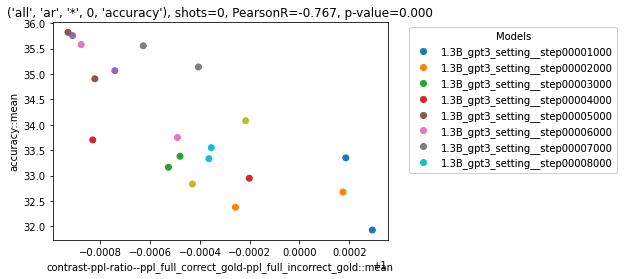

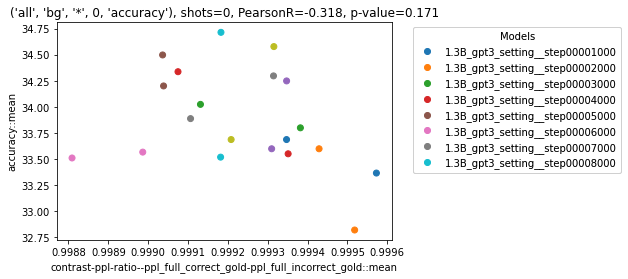

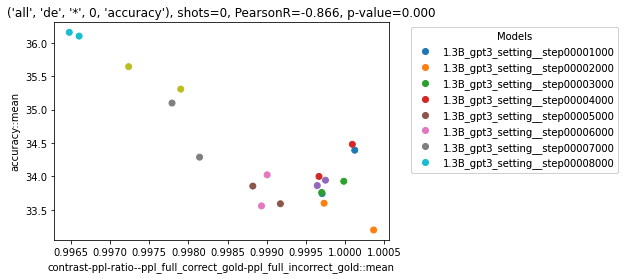

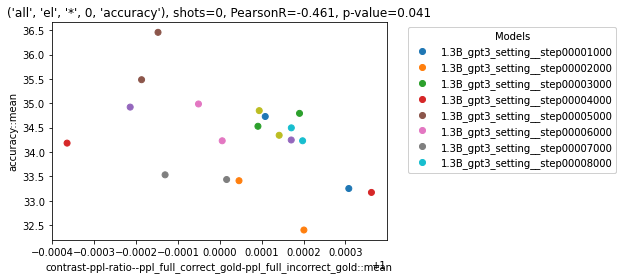

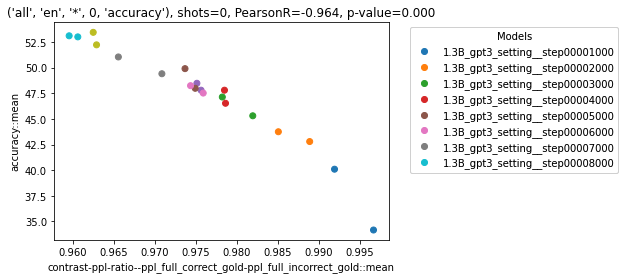

...

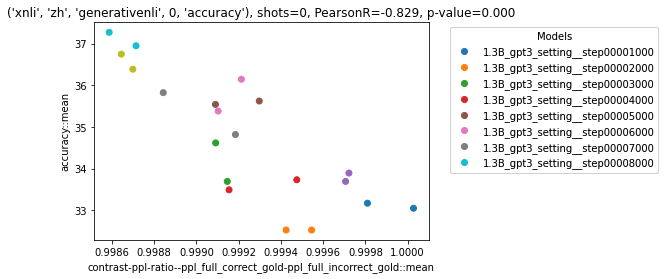

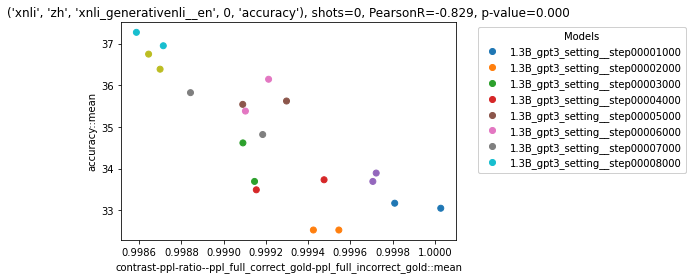

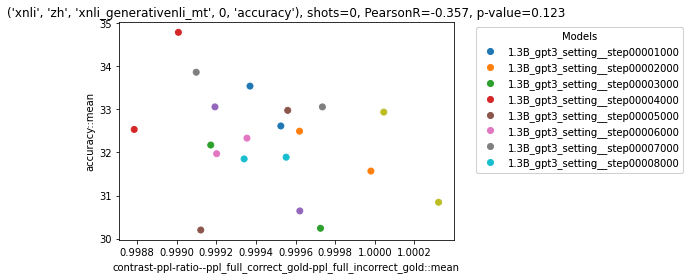

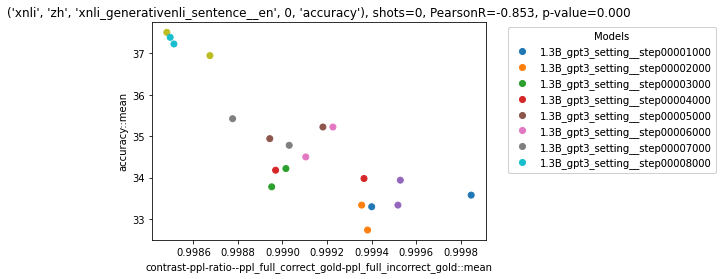

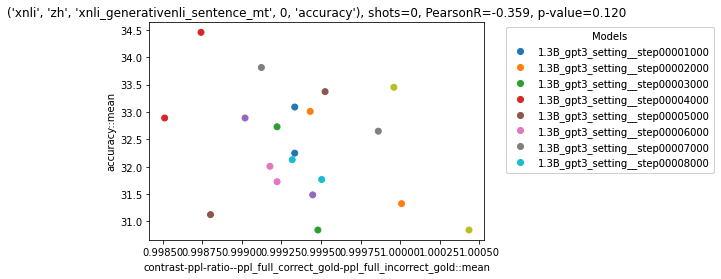

In [14]:
# ppl to accuracy scatter
show_scatter_plot = True
scatter_only_groups = False
scatter_fields = [x for x in ppl_cols[:] if ("ppl-ratio--ppl_full_" in x)
                  #or ("ppl_full_correct_lt_incorrect_gold" in x)
                 ]

# field to 
show_steps_to_metric = False
step_target_fields = [x for x in ppl_cols[:] if ("ppl-ratio--ppl_full_" in x)
                  #or ("ppl_full_correct_lt_incorrect_gold" in x)
                 ] + ['accuracy::mean']

def aggr_values(kv):
    map_kv = {}
    for k,v in kv:
        if k not in map_kv:
            map_kv[k] = [v]
        else:
            map_kv[k].append(v)
    map_kv = [(k,np.mean(v)) for k,v in map_kv.items()]
    
    return map_kv

# calculate the correlations
idx_to_correlation_vals = {}

idx_to_metrics_by_model = {}

metric_cols_all = []
ppl_cols_all = []

for idx, row in metric_pt.iterrows():
    #print(idx, row.items())
    curr_task_name = idx[0]
    curr_shots=idx[3]
    #print(curr_task_name)
    #break
    
    
    cols_with_vals_by_model = {}
    
    for [col, model], val in row.items():
        if not col.endswith("::mean"):
            # Use only result columns
            continue
        if col not in cols_with_vals_by_model:
            cols_with_vals_by_model[col] = []
        cols_with_vals_by_model[col].append((model, val))
    
    #print(f"cols_with_vals_by_model:{cols_with_vals_by_model}")
    #break
    # sort model names and values
    for col in cols_with_vals_by_model.keys():
        cols_with_vals_by_model[col] = sorted(cols_with_vals_by_model[col], key=lambda x: x[0])
        
    idx_to_metrics_by_model[idx] = cols_with_vals_by_model
    
    columns = cols_with_vals_by_model.keys()
    ppl_cols = [x for x in columns if "ppl" in x]
    ppl_cols_all.extend(ppl_cols)
    
    metric_cols = [x for x in columns if x not in ppl_cols]
    metric_cols_all.extend(metric_cols)
    
    
    
    correlation_values = {}
    for metric_col in metric_cols:
        for ppl_col in ppl_cols:
            #print(metric_col, ppl_col)
            
            ppl_model_vals = cols_with_vals_by_model[ppl_col]
            #print(f"ppl_model_vals:{ppl_model_vals}")
            metric_model_vals = cols_with_vals_by_model[metric_col]
            #print(f"metric_model_vals:{metric_model_vals}")
            #break
            
            # select only models 
            common_models = set([x[0] for x in ppl_model_vals]).intersection(set([y[0] for y in metric_model_vals]))
            
            ppl_model_vals = [x for x in ppl_model_vals if x[0] in common_models]
            ppl_model_vals = aggr_values(ppl_model_vals)
            ppl_model_vals = sorted(ppl_model_vals, key = lambda x:x[0])
            
            metric_model_vals = [x for x in metric_model_vals if x[0] in common_models]
            metric_model_vals = aggr_values(metric_model_vals)
            metric_model_vals = sorted(metric_model_vals, key = lambda x:x[0])
            
            
            ppl_models, ppl_vals = zip(*ppl_model_vals)
            metric_models, metric_vals = zip(*metric_model_vals)
            
            assert all([x[0] == x[1] for x in zip(ppl_models, metric_models)]), (idx, metric_col, metric_models, ppl_col, ppl_model_vals)  # assert model names match
            # filter nan values
            #print("Ok")
            
            ppl_metric_non_empty = [x for x in zip(ppl_vals, metric_vals, ppl_models) if not np.isnan(x[0]) and x[0] > 0 and not np.isnan(x[1]) and x[1]>0]
                
            if len(ppl_metric_non_empty) > 2:
                ppl_vals_non_empty, metric_vals_non_empty, models_non_empty = zip(*ppl_metric_non_empty)
            
                pearsonr, pvalue = stats.pearsonr(ppl_vals_non_empty, metric_vals_non_empty) 
                for corr_k, corr_v in [("pearsonr", pearsonr), ("pvalue",pvalue)]:
                    corr_key = f"corr-models--{ppl_col}--{metric_col}--{corr_k}"
                    correlation_values[corr_key] = corr_v
                    
                if show_scatter_plot and ppl_col in scatter_fields:
                    if scatter_only_groups and curr_task_name not in task_display_groups:
                        continue
                        
                    color_value_names = list(sorted(list(set(models_non_empty))))
                    color_field_to_id = {t: i for i,t in enumerate(color_value_names)}
                    color_values = [color_field_to_id[t] for t in list(models_non_empty)]
    
                    fig = plt.figure()
                    ax = fig.add_subplot(111)
                    scatter = ax.scatter(x=ppl_vals_non_empty, 
                                         y=metric_vals_non_empty,
                                         c=color_values,
                                         cmap="tab10",
                                         )
                
                    # Color legend
                    try:
                        color_handles, _ = scatter.legend_elements()
                        color_legend = ax.legend(color_handles, color_value_names, bbox_to_anchor = (1.05, 1.0), loc='upper left', title="Models")
                        ax.add_artist(color_legend)
                    except Exception:
                        print("Error")
                        
                    plt.xlabel(ppl_col)
                    plt.ylabel(metric_col)
                    plt.title(f"{idx}, shots={curr_shots}, PearsonR={pearsonr:.3f}, p-value={pvalue:.3f}")
                    
    pearsonr_cols_vals = [(k, v) for k,v in correlation_values.items() if "pearsonr" in k and not np.isnan(v)]
    if len(pearsonr_cols_vals) > 0:
        pearsonr_cols, pearsonr_vals = zip(*pearsonr_cols_vals)
        correlation_values["_corrs-pearsonr-avg"] = np.mean([x for x in pearsonr_vals]) 
        max_corr_id = np.argmax([abs(x) for x in pearsonr_vals]) 
        correlation_values["_corrs-pearsonr-max-val"] = pearsonr_vals[max_corr_id]
        correlation_values["_corrs-pearsonr-max-col"] = pearsonr_cols[max_corr_id]
        
    idx_to_correlation_vals[idx] = correlation_values               
            
#print(idx_to_correlation_vals)
correlation_data = DataFrame.from_dict(idx_to_correlation_vals, orient="index")
correlation_data = correlation_data[sorted(list(correlation_data.columns))]

out_file = results_json+"_ppl_correlations_by_task.tsv"
correlation_data.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

correlation_data

In [15]:
correlation_data_new = correlation_data[correlation_data.columns]
#print(correlation_data_new)
correlation_data_new.reset_index(inplace=True)
correlation_data_new = correlation_data_new.sort_values(by=["level_3", "level_0"])

out_file = results_json+"_ppl_correlations_by_task_sort_by_shots.tsv"
correlation_data_new.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

set(correlation_data_new["level_0"])

exported to /checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl_ppl_correlations_by_task_sort_by_shots.tsv


{'all', 'all_no_blimp', 'xnli'}

In [16]:
# mean correlations by few_shot size

mean_correlations_by_fewshot = {}

n_shots = list(set(correlation_data_new["level_3"]))
for shot in n_shots:
    if shot not in mean_correlations_by_fewshot:
        mean_correlations_by_fewshot[shot] = {}
    
    corr_data_curr = correlation_data_new[correlation_data_new["level_3"] == shot]
    for col in corr_data_curr.columns:
        vals = list(corr_data_curr[col])
        #print(vals)
        try:
            vals = [x for x in vals if not np.isnan(x)]
        except:
            #print(col)
            continue
        
        mean_correlations_by_fewshot[shot][col] = np.mean(vals)
        #break

mean_corr_by_fs_ds = DataFrame.from_dict(mean_correlations_by_fewshot)

#print(mean_corr_by_fs_ds)
corr_cols = [x.split("--")[1:-2] for x in list(mean_corr_by_fs_ds.index)]
corr_cols = ["--".join(x).replace("::mean", "") for x in corr_cols]

mean_corr_by_fs_ds["ppl_field"] = corr_cols
mean_corr_by_fs_ds["cm"] = [x.split("--")[-1] for x in list(mean_corr_by_fs_ds.index)]
mean_corr_by_fs_ds = mean_corr_by_fs_ds[(mean_corr_by_fs_ds["cm"] == "pearsonr") | (mean_corr_by_fs_ds["cm"] == "pvalue")]

#mean_corr_by_fs_ds = mean_corr_by_fs_ds.sort_values(by=[0])

# group
mean_corr_by_fs_ds = pd.pivot_table(mean_corr_by_fs_ds, values=n_shots, index=["ppl_field"],
                        columns=["cm"], aggfunc=np.mean)
out_file = results_json+"_ppl_correlations_mean.tsv"
mean_corr_by_fs_ds.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

mean_corr_by_fs_ds
#mean_corr_by_fs_ds.sort_values((0, 'pearsonr'), ascending=True)

exported to /checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl_ppl_correlations_mean.tsv


0              
cm                                                  pearsonr        pvalue
ppl_field                                                                 
contrast-ppl-ratio--ppl_answer_correct_gold-ppl... -0.343714  2.953338e-01
contrast-ppl-ratio--ppl_full_correct_gold-ppl_f... -0.479354  1.078386e-01
ppl_answer_correct_gold                            -0.370871  2.019139e-01
ppl_answer_correct_lt_incorrect_gold                0.999999  3.600649e-39
ppl_answer_incorrect_gold                          -0.369370  2.023745e-01
ppl_answer_incorrect_min_gold                      -0.366221  2.048752e-01
ppl_answer_incorrect_std_gold                      -0.402231  1.700027e-01
ppl_candidates                                     -0.369876  2.022184e-01
ppl_candidates_full_prompt                         -0.366291  1.926852e-01
ppl_common_prefix                                  -0.366422  1.904518e-01
ppl_full_correct_gold                              -0.366588  1.924664e-01
ppl_full_correct_lt_incorrect_gold                  0.890888  1.299295e-02
ppl_full_incorrect_gold                            -0.366140  1.927949e-01
ppl_full_incorrect_min_gold                        -0.365297  1.938051e-01
ppl_full_incorrect_std_gold                        -0.392091  1.792339e-01
ppl_full_selected_candidate                        -0.364713  1.939450e-01
ppl_selected_candidate                             -0.365309  2.037631e-01

In [17]:
fixed_columns = [x.strip() for x in "corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_correct_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_correct_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_correct_lt_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_correct_lt_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_min_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_min_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_std_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_std_gold::mean--accuracy::mean--pvalue	corr-models--ppl_calib_candidates::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_candidates::mean--accuracy::mean--pvalue	corr-models--ppl_calib_candidates_full_prompt::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_candidates_full_prompt::mean--accuracy::mean--pvalue	corr-models--ppl_calib_common_prefix::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_common_prefix::mean--accuracy::mean--pvalue	corr-models--ppl_calib_full_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_full_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompt_gold_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompt_gold_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompt_gold_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompt_gold_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_max_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_max_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_max_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_max_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_mean_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_mean_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_mean_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_mean_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_min_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_min_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_min_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_min_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_std_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_std_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_std_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_std_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_candidates::mean--accuracy::mean--pearsonr	corr-models--ppl_candidates::mean--accuracy::mean--pvalue	corr-models--ppl_candidates_full_prompt::mean--accuracy::mean--pearsonr	corr-models--ppl_candidates_full_prompt::mean--accuracy::mean--pvalue	corr-models--ppl_common_prefix::mean--accuracy::mean--pearsonr	corr-models--ppl_common_prefix::mean--accuracy::mean--pvalue	corr-models--ppl_full_correct_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_correct_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_correct_lt_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_correct_lt_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_min_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_min_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_std_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_std_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_full_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_selected_candidate::mean--accuracy::mean--pvalue".split("\t")]
fixed_columns = [x.split("--")[-3] for x in fixed_columns]
fixed_columns = [x if i%2 ==0 else "" for i,x in enumerate(fixed_columns)]
fixed_columns

print("|".join(fixed_columns))
print("|".join(["pearsonr" if i%2 ==0 else "pvalue" for i, x in enumerate(fixed_columns)]))

ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean||ppl_full_correct_gold-ppl_full_incorrect_gold::mean||ppl_answer_correct_gold::mean||ppl_answer_correct_lt_incorrect_gold::mean||ppl_answer_incorrect_gold::mean||ppl_answer_incorrect_min_gold::mean||ppl_answer_incorrect_std_gold::mean||ppl_calib_candidates::mean||ppl_calib_candidates_full_prompt::mean||ppl_calib_common_prefix::mean||ppl_calib_full_selected_candidate::mean||ppl_calib_prompt_gold_mean::mean||ppl_calib_prompt_gold_std::mean||ppl_calib_prompts_cands_max_mean::mean||ppl_calib_prompts_cands_max_std::mean||ppl_calib_prompts_cands_mean_mean::mean||ppl_calib_prompts_cands_mean_std::mean||ppl_calib_prompts_cands_min_mean::mean||ppl_calib_prompts_cands_min_std::mean||ppl_calib_prompts_cands_std_mean::mean||ppl_calib_prompts_cands_std_std::mean||ppl_calib_selected_candidate::mean||ppl_candidates::mean||ppl_candidates_full_prompt::mean||ppl_common_prefix::mean||ppl_full_correct_gold::mean||ppl_full_correct_lt_incorrect_gold::m

In [18]:
raise("Stop auto execution here")

TypeError: exceptions must derive from BaseException

# Display by steps
Below, we plot results for multiple checkpoints.

In [19]:
#Example for idx_to_metrics_by_model:
debug_custom=False
if debug_custom:
    idx_to_metrics_by_model = {('knowledge__common_sense',  # task_name or group_name
      'en',
      '*',
      0,
      'accuracy'): {'accuracy::mean': [('1.3B_gpt3_setting__step00020000',
        42.86994622585142),
       ('1.3B_gpt3_setting__step00050000', 49.581756622186816),
       ('1.3B_gpt3_setting__step00100000', 53.316072495518824),
       ('1.3B_gpt3_setting__step00150000', 55.67616012746465),
       ('1.3B_gpt3_setting__step00200000', 57.040430193188605),
       ('1.3B_gpt3_setting__step00250000',
        58.1557458673571)], },
    ('knowledge',  # task_name or group_name
      'en',
      '*',
      0,
      'accuracy'): {'accuracy::mean': [('1.3B_gpt3_setting__step00020000',
        52.86994622585142),
       ('1.3B_gpt3_setting__step00050000', 59.581756622186816),
       ('1.3B_gpt3_setting__step00100000', 53.316072495518824),
       ('1.3B_gpt3_setting__step00150000', 55.67616012746465),
       ('1.3B_gpt3_setting__step00200000', 57.040430193188605),
       ('1.3B_gpt3_setting__step00250000',
        68.1557458673571)], }
    }


    #If you want to plot multiple lines on the same plot, define task_to_group or group_to_group mappings
    task_to_groups = {
    "knowledge__common_sense": ["knowledge"]
    }


In [20]:
#idx_to_metrics_by_model[0]

In [21]:
task_settings_with_metrics = [x[0] for x in idx_to_metrics_by_model.keys()]


fig:('all', 'ar', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


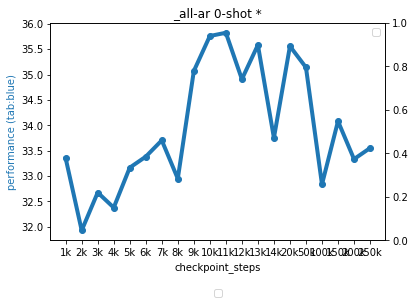

fig:('all', 'bg', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


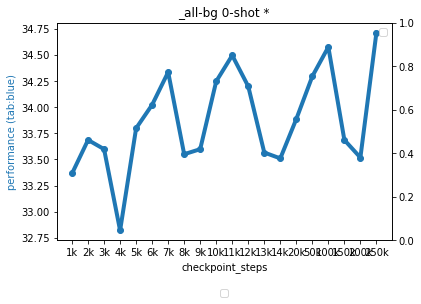

fig:('all', 'de', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


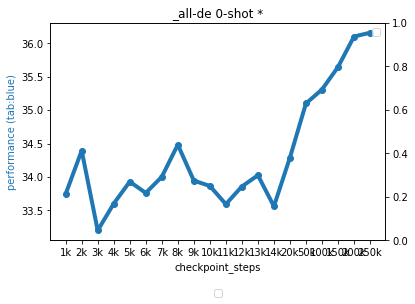

fig:('all', 'el', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


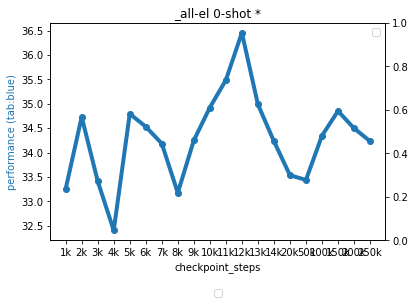

fig:('all', 'en', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


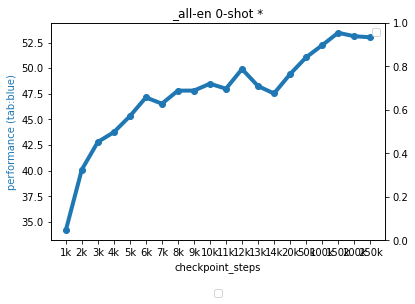

fig:('all', 'es', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


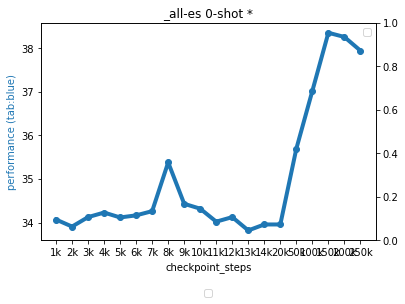

fig:('all', 'fr', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


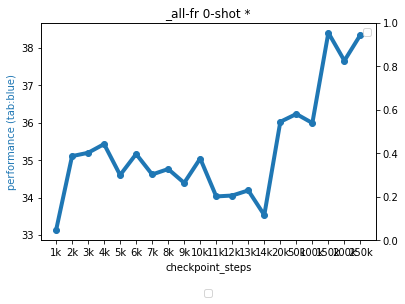

fig:('all', 'hi', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


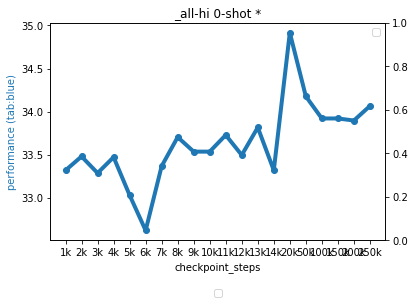

fig:('all', 'ru', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


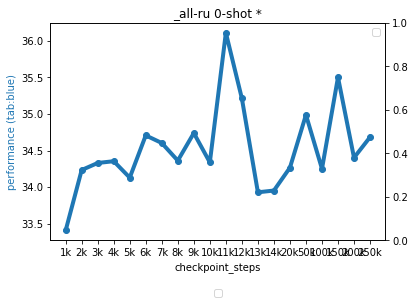

fig:('all', 'sw', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


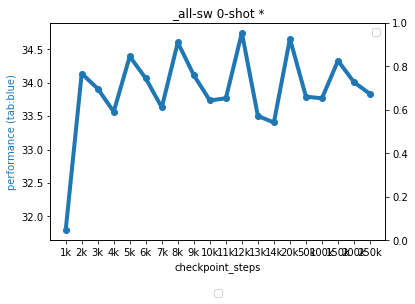

fig:('all', 'th', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


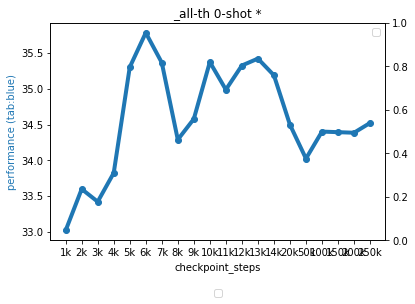

fig:('all', 'tr', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


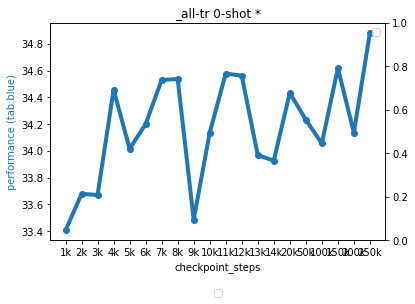

fig:('all', 'ur', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


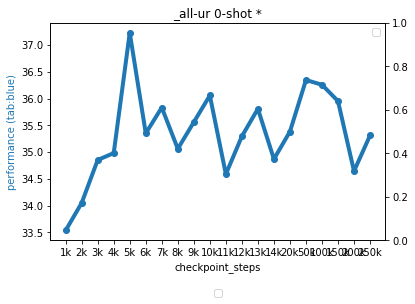

fig:('all', 'vi', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


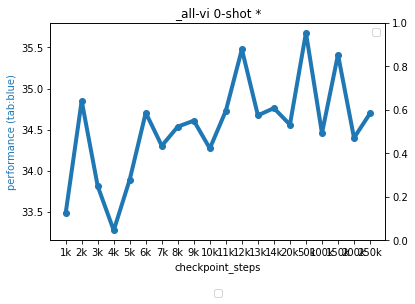

fig:('all', 'zh', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.
WARNING - No handles with labels found to put in legend.


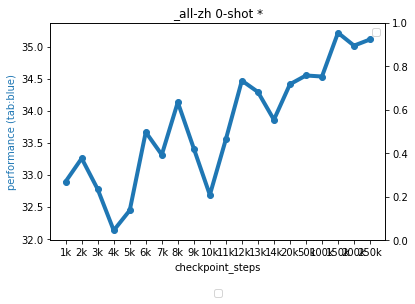

fig:('all_no_blimp', 'ar', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


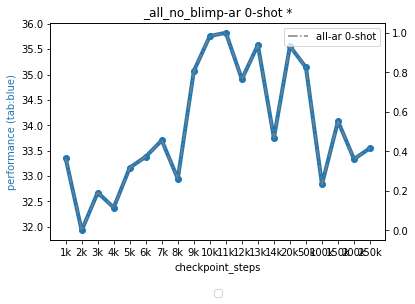

fig:('all_no_blimp', 'bg', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


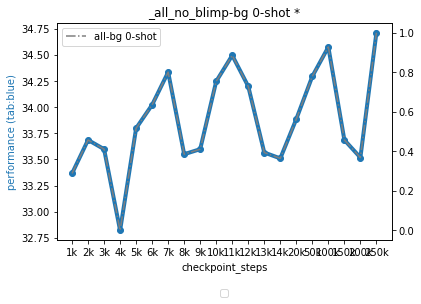

fig:('all_no_blimp', 'de', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


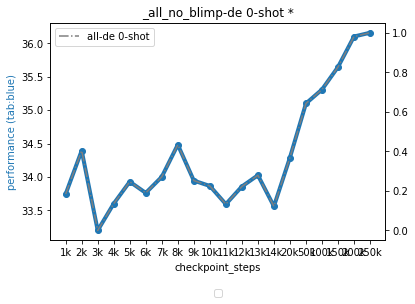

fig:('all_no_blimp', 'el', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


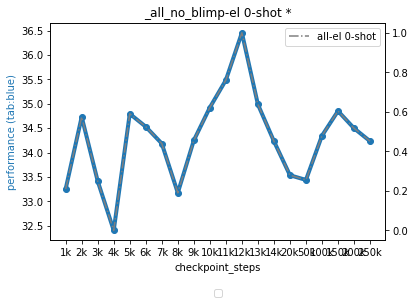

fig:('all_no_blimp', 'en', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


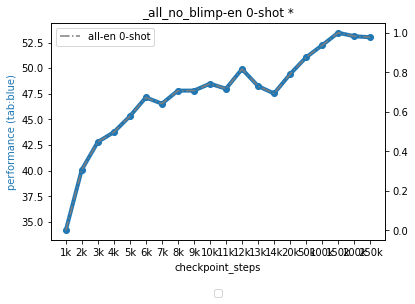

fig:('all_no_blimp', 'es', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


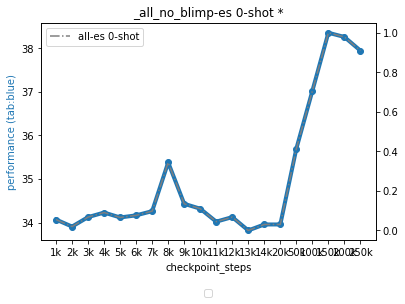

fig:('all_no_blimp', 'fr', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


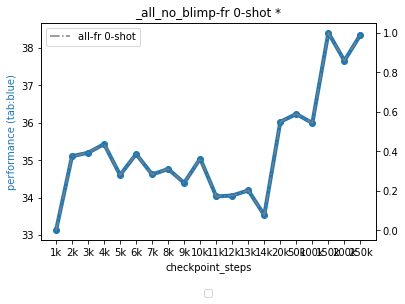

fig:('all_no_blimp', 'hi', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


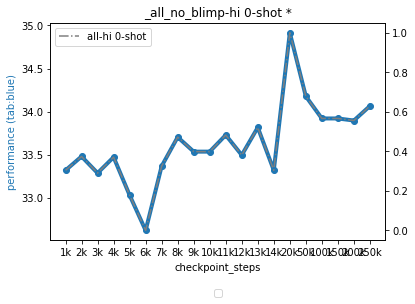

fig:('all_no_blimp', 'ru', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


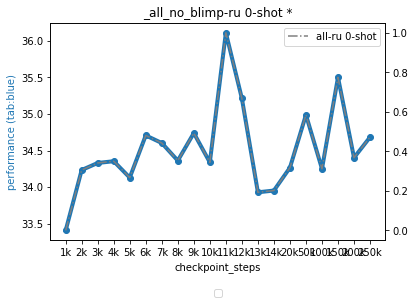

fig:('all_no_blimp', 'sw', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


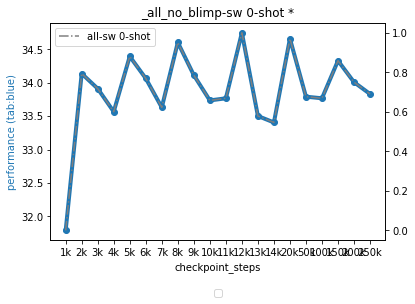

fig:('all_no_blimp', 'th', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


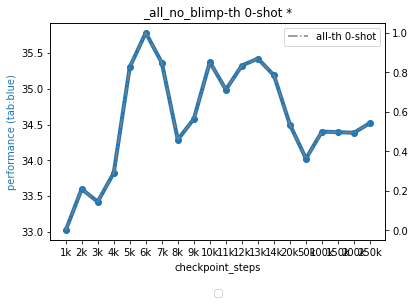

fig:('all_no_blimp', 'tr', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


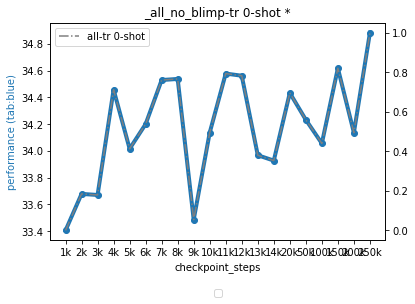

fig:('all_no_blimp', 'ur', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


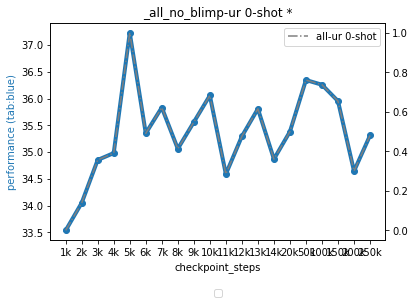

fig:('all_no_blimp', 'vi', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


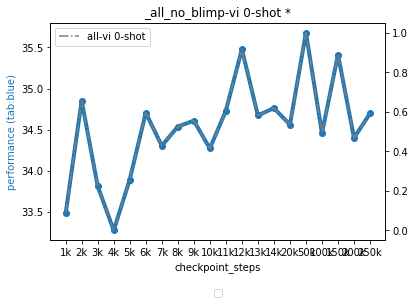

fig:('all_no_blimp', 'zh', '*', 0, 'accuracy')
WARNING - No handles with labels found to put in legend.


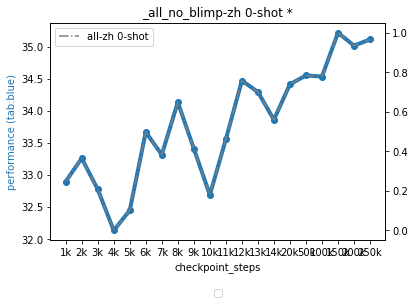

fig:('xnli', 'ar', 'generativenli', 0, 'accuracy')


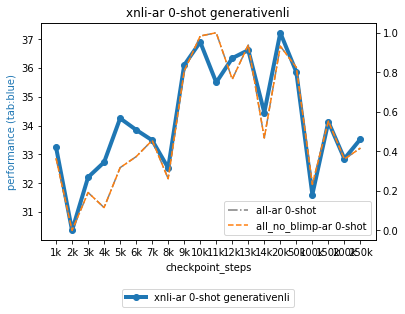

fig:('xnli', 'ar', 'xnli_generativenli__en', 0, 'accuracy')


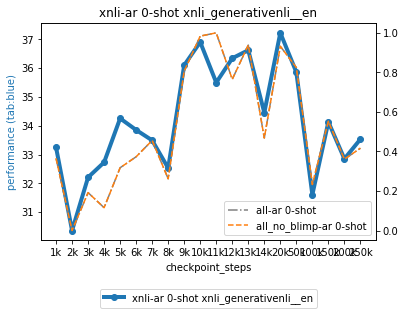

fig:('xnli', 'ar', 'xnli_generativenli_mt', 0, 'accuracy')


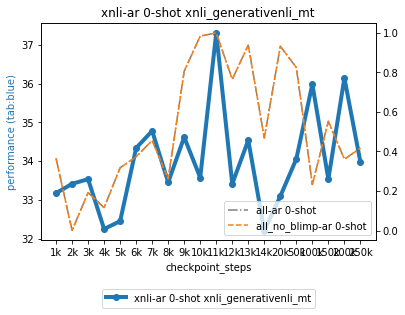

fig:('xnli', 'ar', 'xnli_generativenli_sentence__en', 0, 'accuracy')


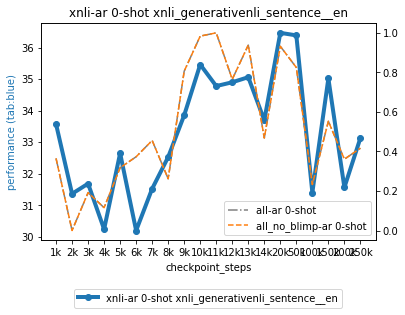

fig:('xnli', 'ar', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


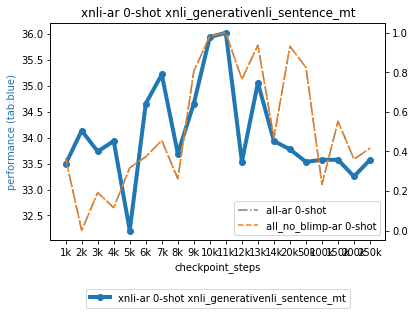

fig:('xnli', 'bg', 'generativenli', 0, 'accuracy')


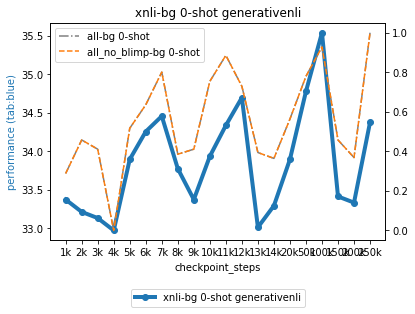

fig:('xnli', 'bg', 'xnli_generativenli__en', 0, 'accuracy')


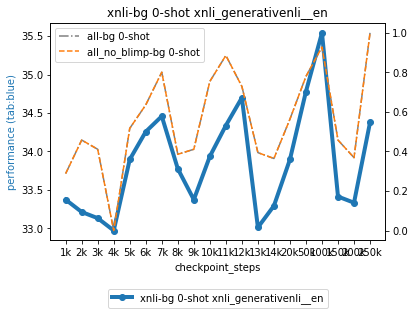

fig:('xnli', 'bg', 'xnli_generativenli_mt', 0, 'accuracy')


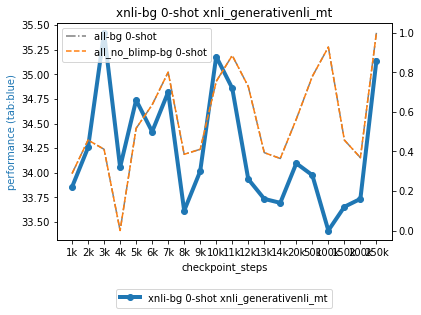

fig:('xnli', 'bg', 'xnli_generativenli_sentence__en', 0, 'accuracy')


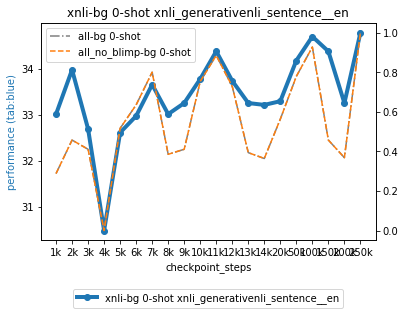

fig:('xnli', 'bg', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


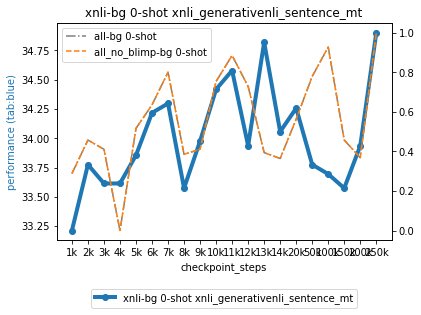

fig:('xnli', 'de', 'generativenli', 0, 'accuracy')


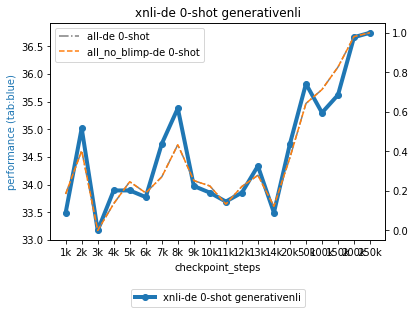

fig:('xnli', 'de', 'xnli_generativenli__en', 0, 'accuracy')


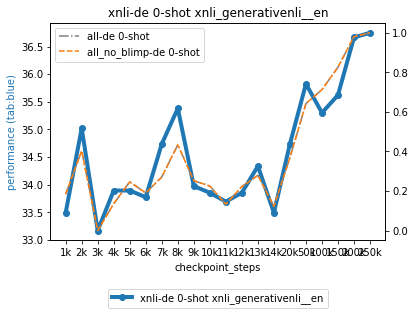

fig:('xnli', 'de', 'xnli_generativenli_mt', 0, 'accuracy')


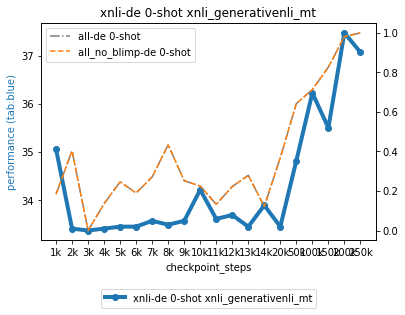

fig:('xnli', 'de', 'xnli_generativenli_sentence__en', 0, 'accuracy')


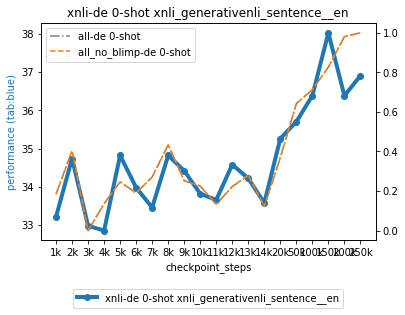

fig:('xnli', 'de', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


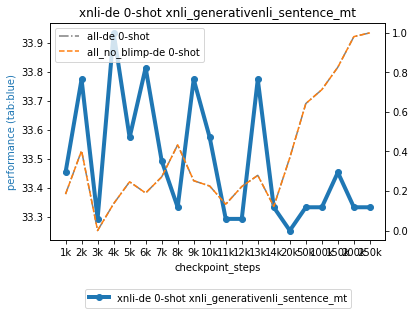

fig:('xnli', 'el', 'generativenli', 0, 'accuracy')


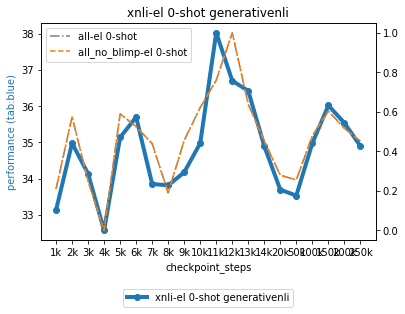

fig:('xnli', 'el', 'xnli_generativenli__en', 0, 'accuracy')


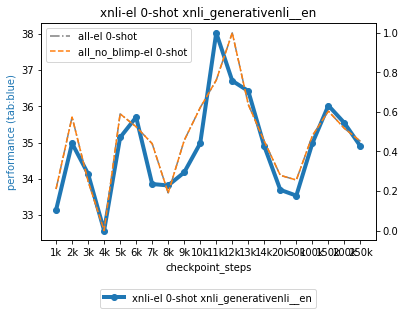

fig:('xnli', 'el', 'xnli_generativenli_mt', 0, 'accuracy')


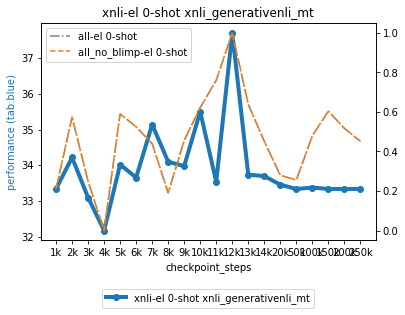

fig:('xnli', 'el', 'xnli_generativenli_sentence__en', 0, 'accuracy')


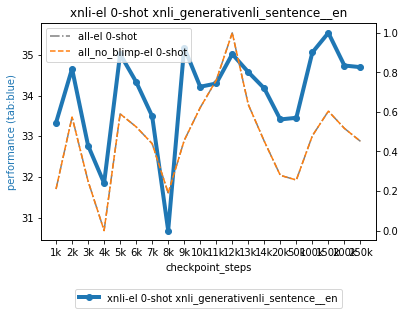

fig:('xnli', 'el', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


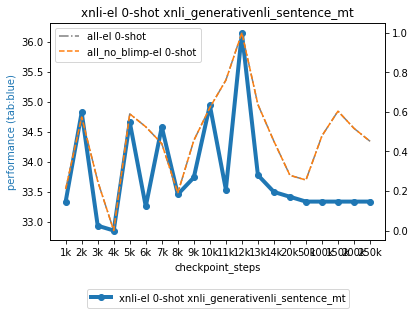

fig:('xnli', 'en', 'generativenli', 0, 'accuracy')


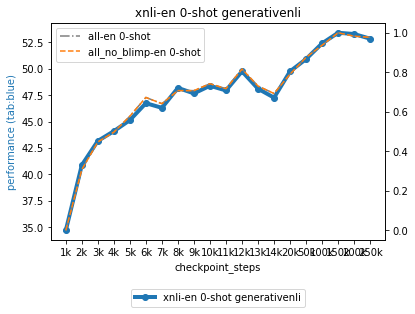

fig:('xnli', 'en', 'xnli_generativenli__en', 0, 'accuracy')


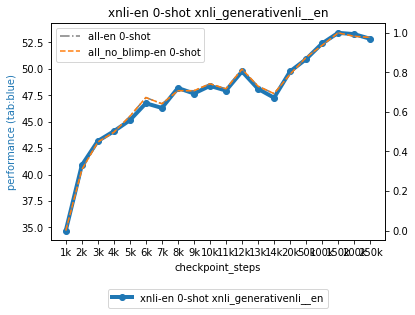

fig:('xnli', 'en', 'xnli_generativenli_mt', 0, 'accuracy')


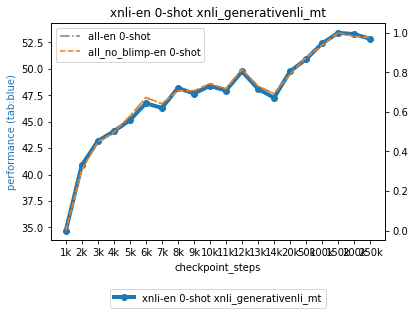

fig:('xnli', 'en', 'xnli_generativenli_sentence__en', 0, 'accuracy')


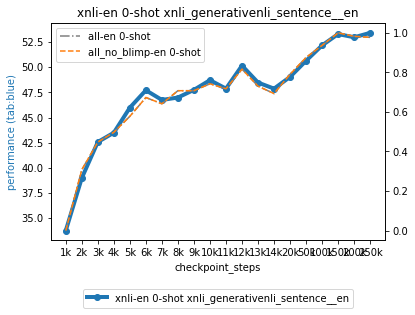

fig:('xnli', 'en', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


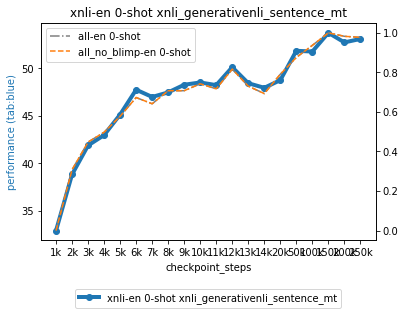

fig:('xnli', 'es', 'generativenli', 0, 'accuracy')


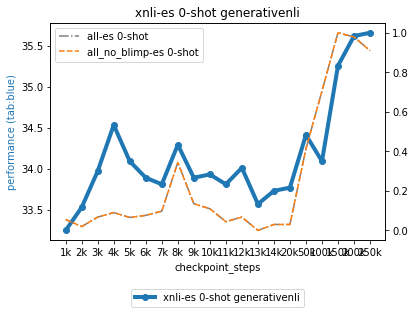

fig:('xnli', 'es', 'xnli_generativenli__en', 0, 'accuracy')


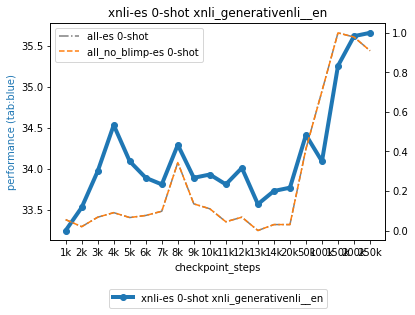

fig:('xnli', 'es', 'xnli_generativenli_mt', 0, 'accuracy')


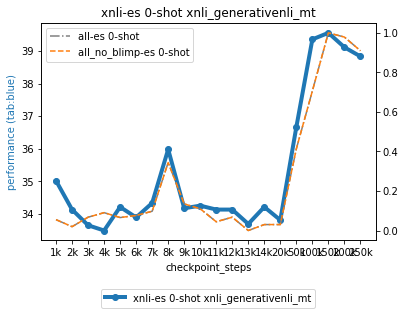

fig:('xnli', 'es', 'xnli_generativenli_sentence__en', 0, 'accuracy')


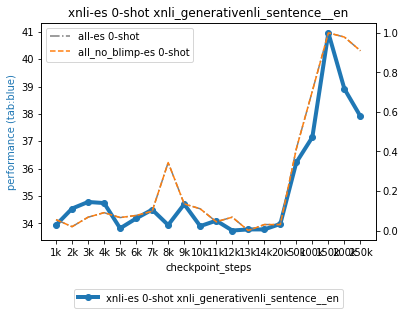

fig:('xnli', 'es', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


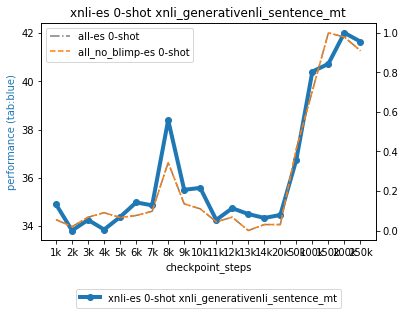

fig:('xnli', 'fr', 'generativenli', 0, 'accuracy')


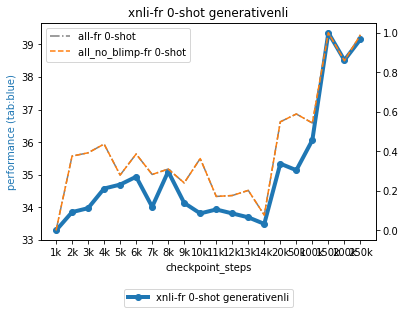

fig:('xnli', 'fr', 'xnli_generativenli__en', 0, 'accuracy')


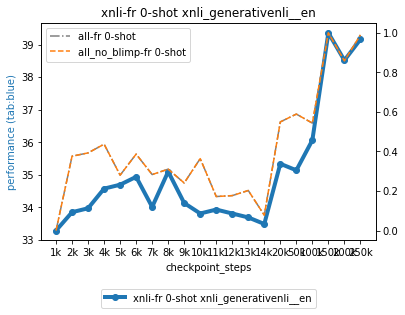

fig:('xnli', 'fr', 'xnli_generativenli_mt', 0, 'accuracy')


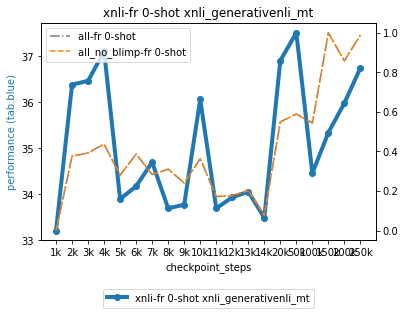

fig:('xnli', 'fr', 'xnli_generativenli_sentence__en', 0, 'accuracy')


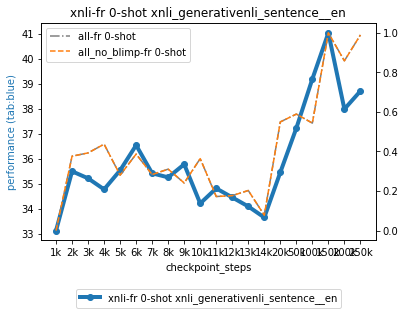

fig:('xnli', 'fr', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


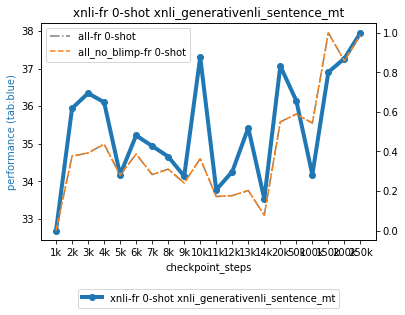

fig:('xnli', 'hi', 'generativenli', 0, 'accuracy')


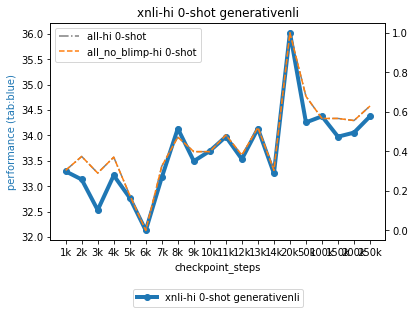

fig:('xnli', 'hi', 'xnli_generativenli__en', 0, 'accuracy')


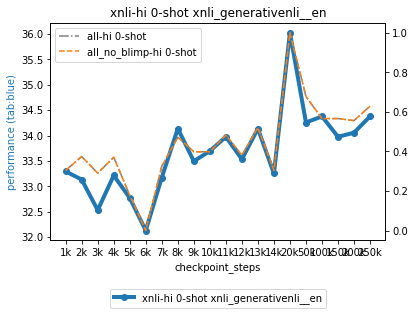

fig:('xnli', 'hi', 'xnli_generativenli_mt', 0, 'accuracy')


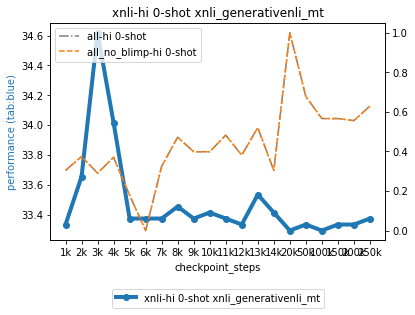

fig:('xnli', 'hi', 'xnli_generativenli_sentence__en', 0, 'accuracy')


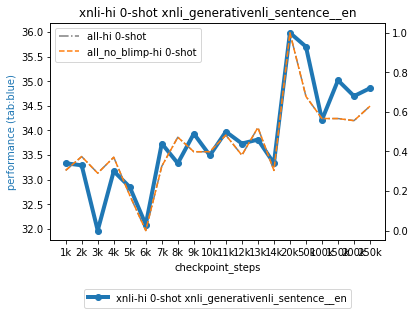

fig:('xnli', 'hi', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


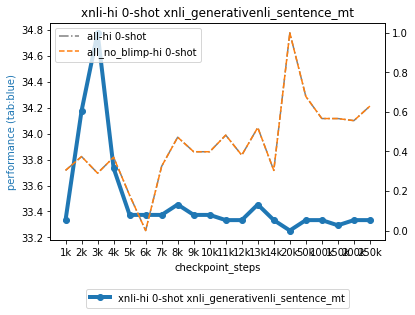

fig:('xnli', 'ru', 'generativenli', 0, 'accuracy')


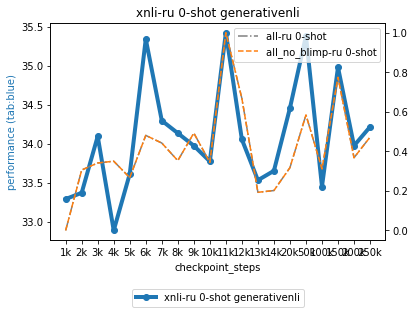

fig:('xnli', 'ru', 'xnli_generativenli__en', 0, 'accuracy')


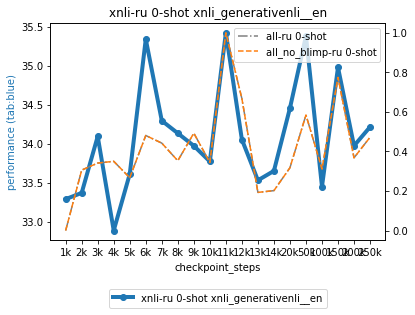

fig:('xnli', 'ru', 'xnli_generativenli_mt', 0, 'accuracy')


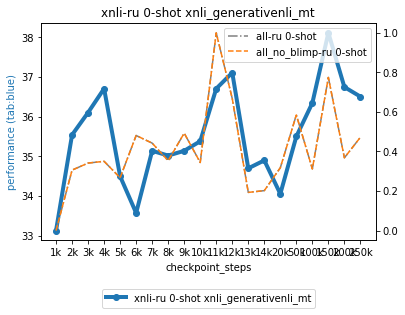

fig:('xnli', 'ru', 'xnli_generativenli_sentence__en', 0, 'accuracy')


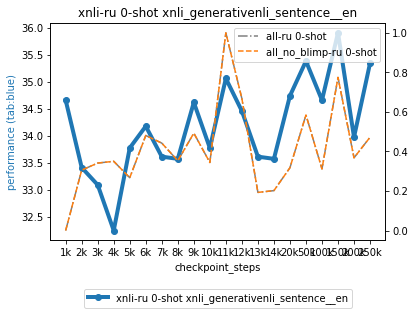

fig:('xnli', 'ru', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


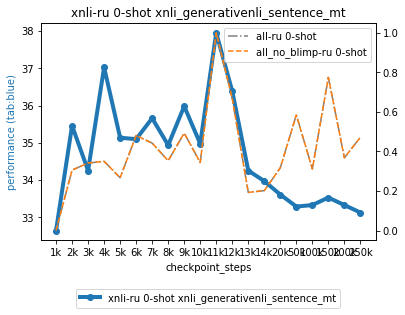

fig:('xnli', 'sw', 'generativenli', 0, 'accuracy')


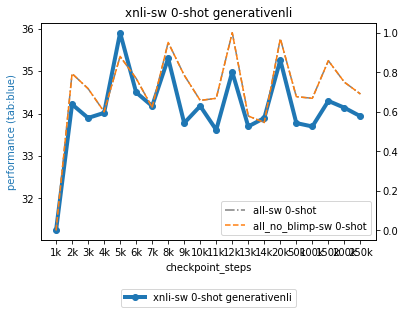

fig:('xnli', 'sw', 'xnli_generativenli__en', 0, 'accuracy')


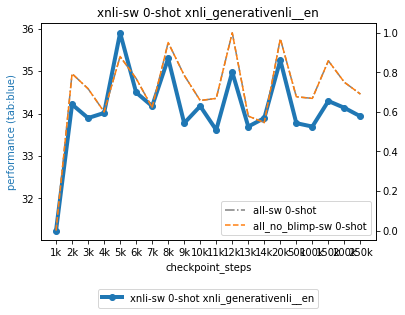

fig:('xnli', 'sw', 'xnli_generativenli_mt', 0, 'accuracy')


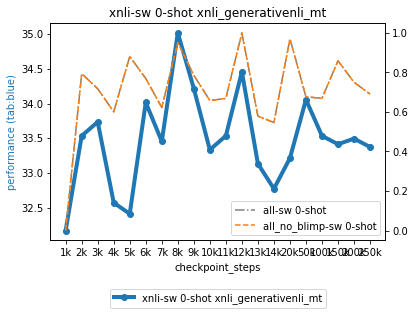

fig:('xnli', 'sw', 'xnli_generativenli_sentence__en', 0, 'accuracy')


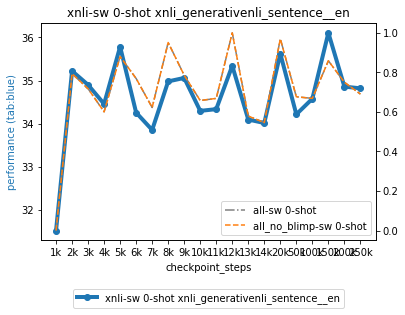

fig:('xnli', 'sw', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


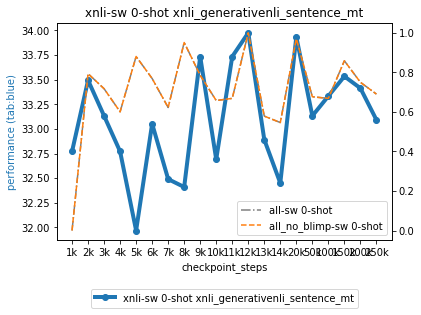

fig:('xnli', 'th', 'generativenli', 0, 'accuracy')


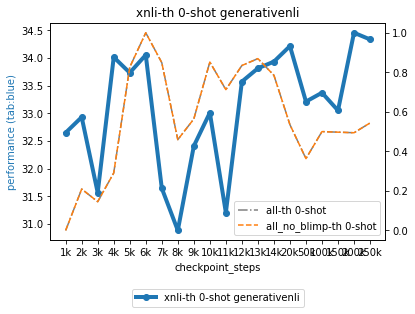

fig:('xnli', 'th', 'xnli_generativenli__en', 0, 'accuracy')


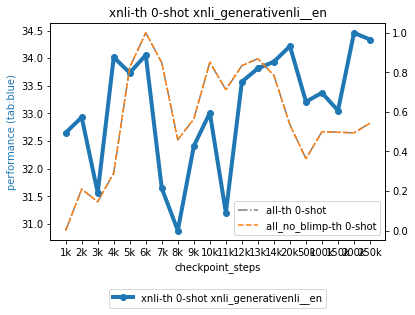

fig:('xnli', 'th', 'xnli_generativenli_mt', 0, 'accuracy')


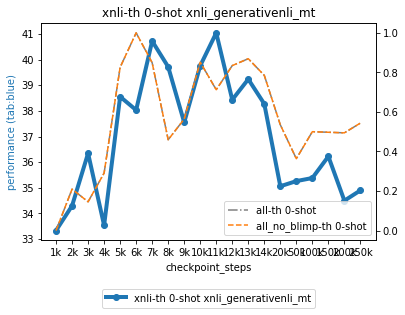

fig:('xnli', 'th', 'xnli_generativenli_sentence__en', 0, 'accuracy')


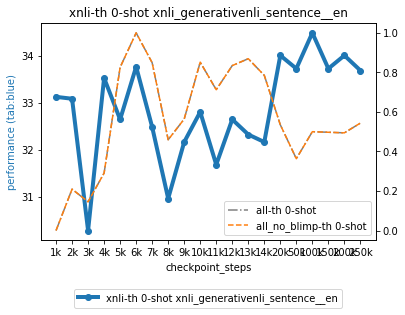

fig:('xnli', 'th', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


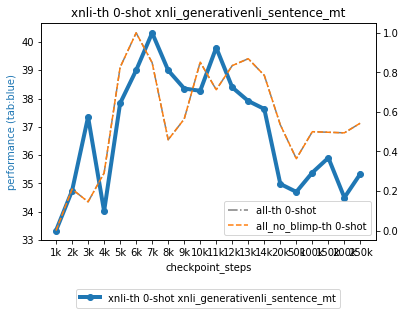

fig:('xnli', 'tr', 'generativenli', 0, 'accuracy')


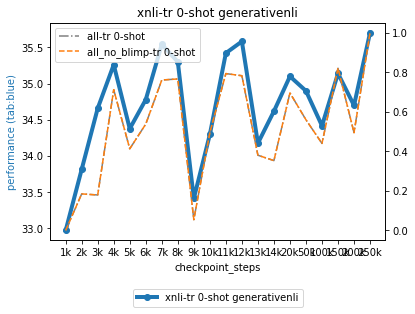

fig:('xnli', 'tr', 'xnli_generativenli__en', 0, 'accuracy')


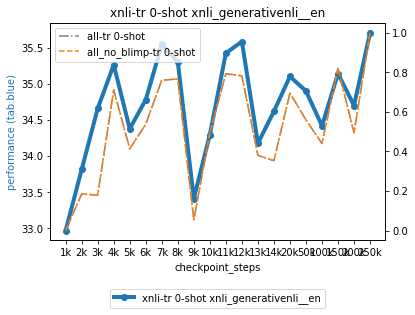

fig:('xnli', 'tr', 'xnli_generativenli_mt', 0, 'accuracy')


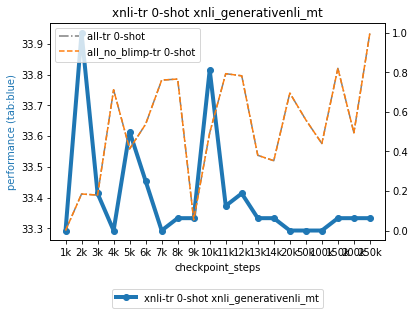

fig:('xnli', 'tr', 'xnli_generativenli_sentence__en', 0, 'accuracy')


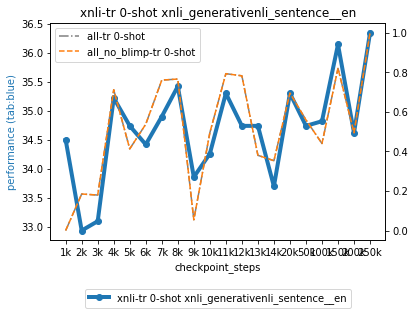

fig:('xnli', 'tr', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


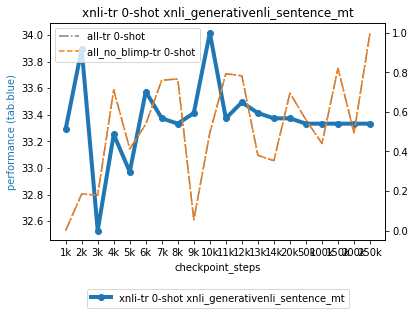

fig:('xnli', 'ur', 'generativenli', 0, 'accuracy')


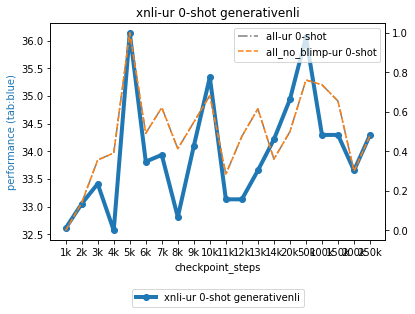

fig:('xnli', 'ur', 'xnli_generativenli__en', 0, 'accuracy')


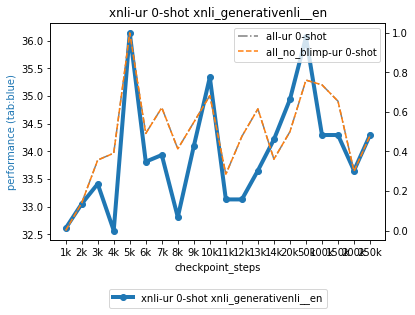

fig:('xnli', 'ur', 'xnli_generativenli_mt', 0, 'accuracy')


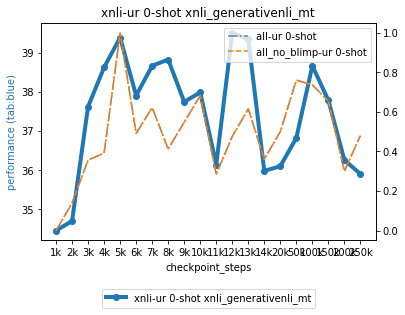

fig:('xnli', 'ur', 'xnli_generativenli_sentence__en', 0, 'accuracy')


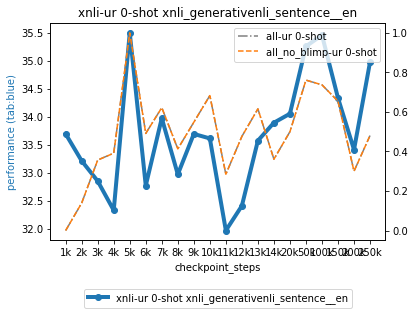

fig:('xnli', 'ur', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


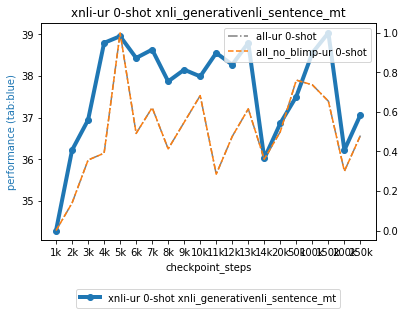

fig:('xnli', 'vi', 'generativenli', 0, 'accuracy')


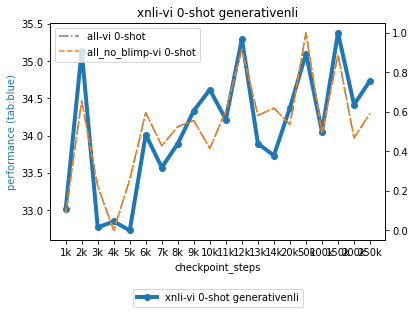

fig:('xnli', 'vi', 'xnli_generativenli__en', 0, 'accuracy')


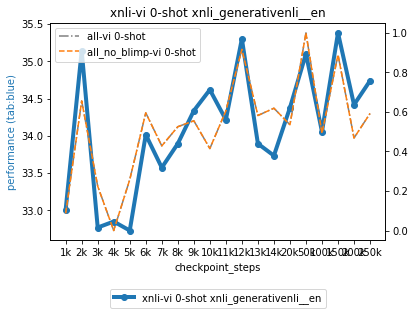

fig:('xnli', 'vi', 'xnli_generativenli_mt', 0, 'accuracy')


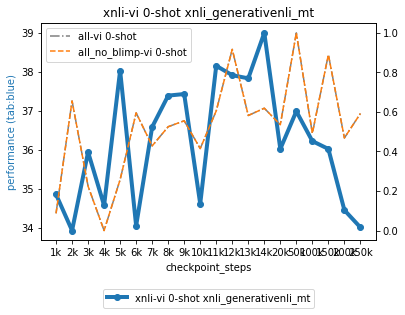

fig:('xnli', 'vi', 'xnli_generativenli_sentence__en', 0, 'accuracy')


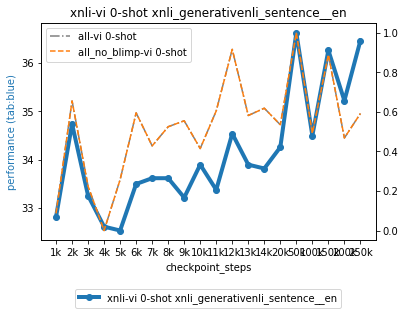

fig:('xnli', 'vi', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


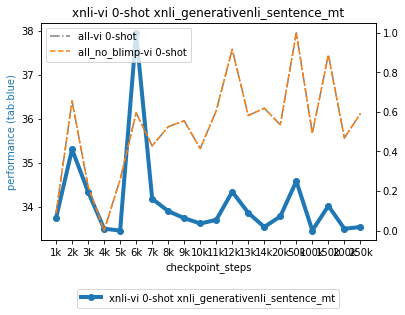

fig:('xnli', 'zh', 'generativenli', 0, 'accuracy')


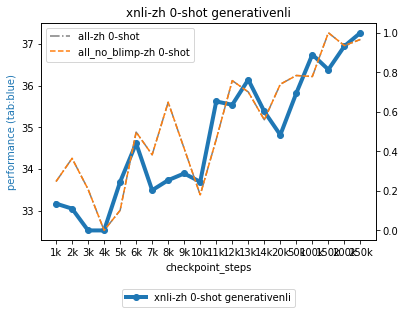

fig:('xnli', 'zh', 'xnli_generativenli__en', 0, 'accuracy')


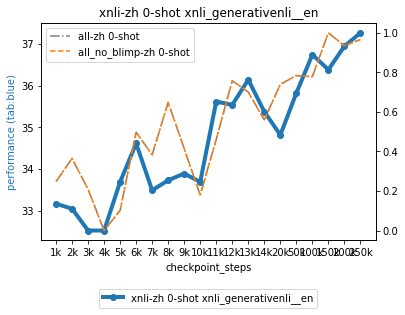

fig:('xnli', 'zh', 'xnli_generativenli_mt', 0, 'accuracy')


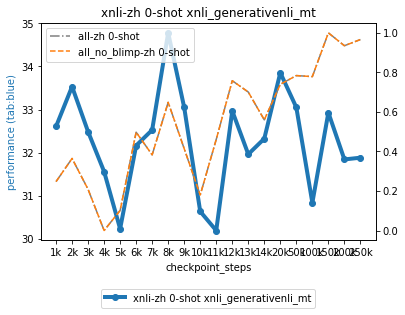

fig:('xnli', 'zh', 'xnli_generativenli_sentence__en', 0, 'accuracy')


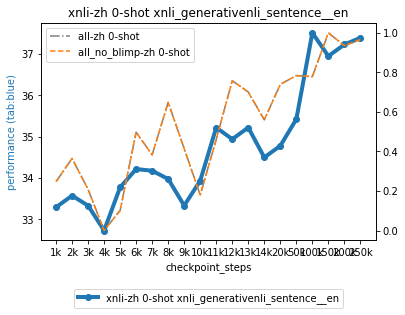

fig:('xnli', 'zh', 'xnli_generativenli_sentence_mt', 0, 'accuracy')


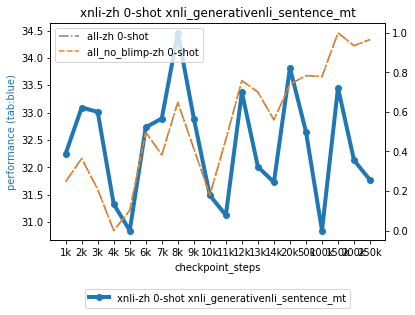

In [22]:
def flatten(list_of_lists):
    return [item for sublist in list_of_lists for item in sublist]

max_plotted = 0
# task_to_groups
# task_display_groups
def normalize(vals, lower=0.0, upper=1.0):
    min_val = min(vals)
    max_val = max(vals)
    return [lower + (x - min_val) * (upper - lower)/(0.0001 + max_val - min_val) for x in vals]
    
def get_plot_fields(v, col_info, related_vals=False):
    metric_key = col_info["key"]
    vals_func = col_info["vals_func"]
    if related_vals:
        rel_vals_func = col_info.get("related_vals_func", None)
        if rel_vals_func is not None:
            vals_func = rel_vals_func
        
        rel_lbl = False
        
    vals = vals_func(v[metric_key])
    lbl = col_info["lbl"] if not related_vals else col_info.get("rel_lbl", col_info["lbl"])
    
    return lbl, vals

# Line styles
main_style = {"color":"tab:blue", "linewidth":4, "marker":'o'}
special_styles = {"all": {"linestyle":"-.", "color":"tab:gray"}}
related_styles = [{"color":cl, "linestyle":lst} for cl in ["tab:orange", "tab:green", "tab:red", "tab:purple", 
                                                           "tab:brown", "tab:pink", "tab:olive", "tab:cyan"]
                                                for lst in ["dashed", "dotted"] ]

    

# ('arceasy', 'en', 'arc_old', 0, 'accuracy'), {'accuracy::mean': [('1.3B_gpt3_setting__step00020000', 46.11283873833852), ('1.3B_gpt3_setting__step00050000', 50.06663705019991), ('1.3B_gpt3_setting__step00100000', 51.66592625499778), ('1.3B_gpt3_setting__step00150000', 52.59884495779654)
x_columns = [{'lbl': "checkpoint_steps", "key": 'accuracy::mean', "vals_func": lambda vals: [str(int(get_checkpoint_step_form_modelname(x)/1000))+'k' for x, y in vals]}]
y_columns = [
    {'lbl': "performance", "key": 'accuracy::mean', "vals_func": lambda vals: [y for x, y in vals],
                                  'rel_lbl': "performance (normalized)",  "related_vals_func": lambda vals: normalize([y for x, y in vals])},
             #{'lbl': "ppl-contrast - normalized", "key": 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean', "vals_func": lambda vals: normalize([y for x, y in vals])}
 #            {'lbl': "performance", "key": 'accuracy::mean', "vals_func": lambda vals: [y for x, y in vals], "plot_related": False},
            ]


plotted_cnt =  0 
for exp_setting, exp_results in idx_to_metrics_by_model.items():
    print(f"fig:{exp_setting}")
    task=exp_setting[0]
    group_prefix = ""
    if task in groups_to_groups:
        group_prefix = "_"
    title = "{group_prefix}{task}-{lang} {shots}-shot {template}".format(task=task, lang=exp_setting[1], template=exp_setting[2], shots=exp_setting[3], group_prefix=group_prefix)
    main_results = exp_results  # these are the results to plot as main
    #print(main_results)
    
    # we also plate the grouped results where the current seting participates
    related_results = []
    curr_task_groups = list(set(task_to_groups.get(task, []) + groups_to_groups.get(task, [])))
    for ctg in curr_task_groups:
        rel_result_key = (ctg, exp_setting[1], "*", exp_setting[3], exp_setting[4])
        if rel_result_key in idx_to_metrics_by_model:
            related_results.append((rel_result_key, idx_to_metrics_by_model[rel_result_key]))
    related_results.sort(key = lambda x: x[0][0])
    
    for x_col in x_columns:
        for y_col in y_columns:
            plot_rel_on_sep_ax = "related_vals_func" in y_col
            plt.rcParams['axes.facecolor']='white'
            fig, ax_main = plt.subplots()
            rect = fig.patch
            rect.set_facecolor("white")
            
            ax_rel = ax_main.twinx() if plot_rel_on_sep_ax else ax_main
            
            # main results
            x_lbl, x_vals, y_lbl, y_vals = get_plot_fields(main_results, x_col) + get_plot_fields(main_results, y_col)
            ax_main.plot(x_vals, y_vals, label=title, **main_style)
            ax_main.set_ylabel(f"{y_lbl} ({main_style['color']})", color=main_style['color'])
            ax_main.set_xlabel(x_lbl)
            
            
            
            if y_col.get("plot_related", True):
                rel_style_id = 0
                # related results (groups)
                for rel_setting, rel_result in related_results:
                    rel_task_name = rel_setting[0]
                    rel_title = "{task}-{lang} {shots}-shot".format(task=rel_task_name, lang=rel_setting[1], shots=rel_setting[3])
                    _, rel_x_vals, rel_y_lbl, rel_y_vals = get_plot_fields(rel_result, x_col, related_vals=True) + get_plot_fields(rel_result, y_col, related_vals=True)

                    # style 
                    rel_style = special_styles.get(rel_task_name, None)
                    if rel_style is None:
                        rel_style = related_styles[rel_style_id]
                        rel_style_id += 1

                    ax_rel.plot(rel_x_vals, rel_y_vals, label=rel_title, **rel_style)
                
#                 if plot_rel_on_sep_ax:
#                     ax_rel.set_ylabel(f"{rel_y_lbl}")
            
            if plot_rel_on_sep_ax:
                ax_rel.legend()
                ax_main.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2))
            else:
                ax_main.legend()
                
            plt.title(title)
            plt.show()
    
    plotted_cnt += 1
    if max_plotted > 0 and plotted_cnt> max_plotted:
        break


